In [258]:
# Import  dependencies
import pandas as pd
import numpy as np
import scipy.stats as stats
from scipy.stats import norm

# for modeling of different kinds
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

# Linear Regression
from sklearn.linear_model import LinearRegression

# Lasso Regression
from sklearn.linear_model import Lasso

# Ridge Regression
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.model_selection import cross_val_score

# Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

import sklearn.linear_model as linear_model
import tensorflow as tf

# for charting
import seaborn as sns
import matplotlib.pyplot as plt
import os

# to mount files from local drive
from google.colab import drive
from google.colab import files

In [6]:
# keras_tuner is not part of default google colab, so had to be installed and then imported separately
!pip install keras_tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 2.7 MB/s eta 0:00:00


In [7]:

import keras_tuner as kt

## Load Data

In [8]:
# mount the local drive
drive.mount('/content/drive')


Mounted at /content/drive


In [9]:
# Upload the ames training file
uploaded = files.upload()

Saving ames_homes_train.csv to ames_homes_train.csv


In [10]:
# Upload the ames testing data
uploaded = files.upload()

Saving ames_homes_test.csv to ames_homes_test.csv


In [11]:
# List files in the current directory
files_in_colab = os.listdir()
print(files_in_colab)


['.config', 'ames_homes_test.csv', 'ames_homes_train.csv', 'drive', 'sample_data']


In [12]:
# Get training data and read into Pandas DataFrame
ames_homes_train_df = pd.read_csv('ames_homes_train.csv')

In [13]:
# Get testing data
ames_homes_test_df = pd.read_csv('ames_homes_test.csv')

## Exploratory Data Analysis

In [14]:
# Display dataset lengths
print(f"Ames train records: {len(ames_homes_train_df)}")
print(f"Ames test records: {len(ames_homes_test_df)}")

Ames train records: 1460
Ames test records: 1459


In [15]:
# display first few records for training data
ames_homes_train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [16]:
# display first few records for test data

ames_homes_test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [17]:
# examine training data statistics
ames_homes_train_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [18]:
# examine testing data statistics
ames_homes_test_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,1459.000000,1459.000000,1232.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1444.000000,1458.000000,...,1458.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,2190.000000,57.378341,68.580357,9819.161069,6.078821,5.553804,1971.357779,1983.662783,100.709141,439.203704,...,472.768861,93.174777,48.313914,24.243317,1.794380,17.064428,1.744345,58.167923,6.104181,2007.769705
std,421.321334,42.746880,22.376841,4955.517327,1.436812,1.113740,30.390071,21.130467,177.625900,455.268042,...,217.048611,127.744882,68.883364,67.227765,20.207842,56.609763,30.491646,630.806978,2.722432,1.301740
min,1461.000000,20.000000,21.000000,1470.000000,1.000000,1.000000,1879.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,1825.500000,20.000000,58.000000,7391.000000,5.000000,5.000000,1953.000000,1963.000000,0.000000,0.000000,...,318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,2190.000000,50.000000,67.000000,9399.000000,6.000000,5.000000,1973.000000,1992.000000,0.000000,350.500000,...,480.000000,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,2554.500000,70.000000,80.000000,11517.500000,7.000000,6.000000,2001.000000,2004.000000,164.000000,753.500000,...,576.000000,168.000000,72.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,2919.000000,190.000000,200.000000,56600.000000,10.000000,9.000000,2010.000000,2010.000000,1290.000000,4010.000000,...,1488.000000,1424.000000,742.000000,1012.000000,360.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000


In [19]:
# Train has 81 cols, test has 80.  Determine the missing column in the test data.
# The test data does not contain the SalePrice.

print(ames_homes_train_df.columns)
print(ames_homes_test_df.columns)

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [20]:
# Determine the number of unique values in each column of training and testing data
unique_train_counts = ames_homes_train_df.nunique()
unique_test_counts = ames_homes_test_df.nunique()

print("Training counts")
for n, cnt in unique_train_counts.items():
  print(f"cat: {n}  count: {cnt}")


Training counts
cat: Id  count: 1460
cat: MSSubClass  count: 15
cat: MSZoning  count: 5
cat: LotFrontage  count: 110
cat: LotArea  count: 1073
cat: Street  count: 2
cat: Alley  count: 2
cat: LotShape  count: 4
cat: LandContour  count: 4
cat: Utilities  count: 2
cat: LotConfig  count: 5
cat: LandSlope  count: 3
cat: Neighborhood  count: 25
cat: Condition1  count: 9
cat: Condition2  count: 8
cat: BldgType  count: 5
cat: HouseStyle  count: 8
cat: OverallQual  count: 10
cat: OverallCond  count: 9
cat: YearBuilt  count: 112
cat: YearRemodAdd  count: 61
cat: RoofStyle  count: 6
cat: RoofMatl  count: 8
cat: Exterior1st  count: 15
cat: Exterior2nd  count: 16
cat: MasVnrType  count: 4
cat: MasVnrArea  count: 327
cat: ExterQual  count: 4
cat: ExterCond  count: 5
cat: Foundation  count: 6
cat: BsmtQual  count: 4
cat: BsmtCond  count: 4
cat: BsmtExposure  count: 4
cat: BsmtFinType1  count: 6
cat: BsmtFinSF1  count: 637
cat: BsmtFinType2  count: 6
cat: BsmtFinSF2  count: 144
cat: BsmtUnfSF  count: 

In [21]:
print("Testing counts")

for item, cntr in unique_test_counts.items():
  print(f"cat: {item}  count: {cntr}")

Testing counts
cat: Id  count: 1459
cat: MSSubClass  count: 16
cat: MSZoning  count: 5
cat: LotFrontage  count: 115
cat: LotArea  count: 1106
cat: Street  count: 2
cat: Alley  count: 2
cat: LotShape  count: 4
cat: LandContour  count: 4
cat: Utilities  count: 1
cat: LotConfig  count: 5
cat: LandSlope  count: 3
cat: Neighborhood  count: 25
cat: Condition1  count: 9
cat: Condition2  count: 5
cat: BldgType  count: 5
cat: HouseStyle  count: 7
cat: OverallQual  count: 10
cat: OverallCond  count: 9
cat: YearBuilt  count: 106
cat: YearRemodAdd  count: 61
cat: RoofStyle  count: 6
cat: RoofMatl  count: 4
cat: Exterior1st  count: 13
cat: Exterior2nd  count: 15
cat: MasVnrType  count: 4
cat: MasVnrArea  count: 303
cat: ExterQual  count: 4
cat: ExterCond  count: 5
cat: Foundation  count: 6
cat: BsmtQual  count: 4
cat: BsmtCond  count: 4
cat: BsmtExposure  count: 4
cat: BsmtFinType1  count: 6
cat: BsmtFinSF1  count: 669
cat: BsmtFinType2  count: 6
cat: BsmtFinSF2  count: 161
cat: BsmtUnfSF  count: 7

In [24]:
# Examine individual fields for possible exclusion or binning
fence_counts = ames_homes_train_df['Fence'].value_counts()
fence_counts

MnPrv    157
GdPrv     59
GdWo      54
MnWw      11
Name: Fence, dtype: int64

In [25]:
# Examine building sub class for possible exclusion or binning.  This class is one where training and testing classes differ
# Utilities, Condition1, Condition2, Heating, BldgType, and RoofMtl also have differences between train and test.

class_counts = ames_homes_train_df['MSSubClass'].value_counts()
class_counts

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64

In [26]:
test_class_counts = ames_homes_test_df['MSSubClass'].value_counts()
test_class_counts

20     543
60     276
50     143
120     95
30      70
70      68
160     65
80      60
90      57
190     31
85      28
75       7
180      7
45       6
40       2
150      1
Name: MSSubClass, dtype: int64

<ipython-input-27-63f660087aae>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ames_homes_train_df['SalePrice'], fit=norm);


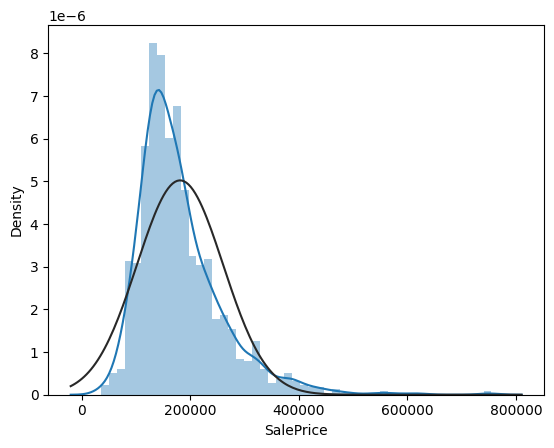

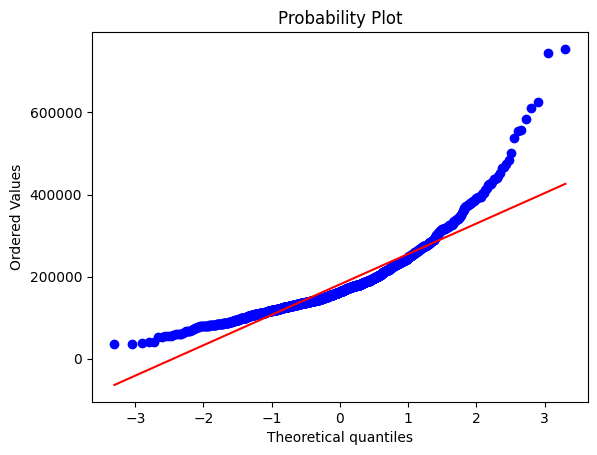

In [27]:
# examine histogram and normal probability plot of price
# sales price is not normally distributed
sns.distplot(ames_homes_train_df['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(ames_homes_train_df['SalePrice'], plot=plt)

<Axes: >

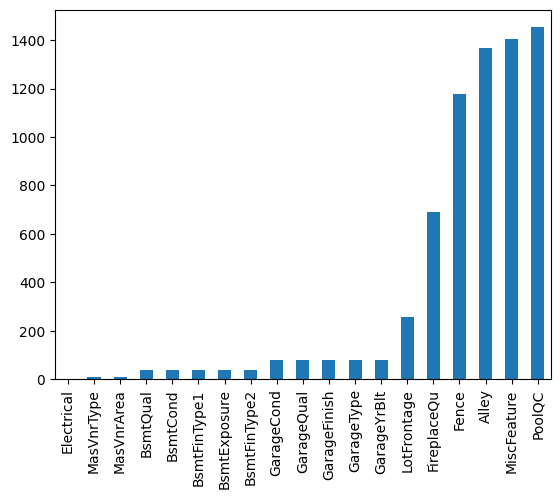

In [28]:
# Examine NA data, of which there is a lot

# From manual selection of features to process for initial run, most of thesee were
# excluded for reasons of suspected relevance to home buyers
# or highly closely correlated, but some, like fence and garage type, were not
# Later examination of the price correlations showed that many of the
# maually selected fields were negatively correlated with price

missing_data = ames_homes_train_df.isnull().sum()
missing_data = missing_data[missing_data > 0]
missing_data.sort_values(inplace=True)
missing_data.plot.bar()

## Data Preprocessing

In [55]:
# split quantitative and categorical features so that the categorical can be encoded

quantitative_features = [feat for feat in ames_homes_train_df.columns if ames_homes_train_df.dtypes[feat] != 'object']

qualitative_features  = [feat for feat in ames_homes_train_df.columns if ames_homes_train_df.dtypes[feat] == 'object']

In [181]:
# Create new DataFramse by selecting the specified columns
quant_df = ames_homes_train_df[quantitative_features]
qual_df = ames_homes_train_df[qualitative_features]


# Display first few to check
quant_df.columns


Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [87]:
# Create pair plots
sns.pairplot(quant_df)
plt.suptitle("Pair Relationships for Numeric Features")
plt.show()

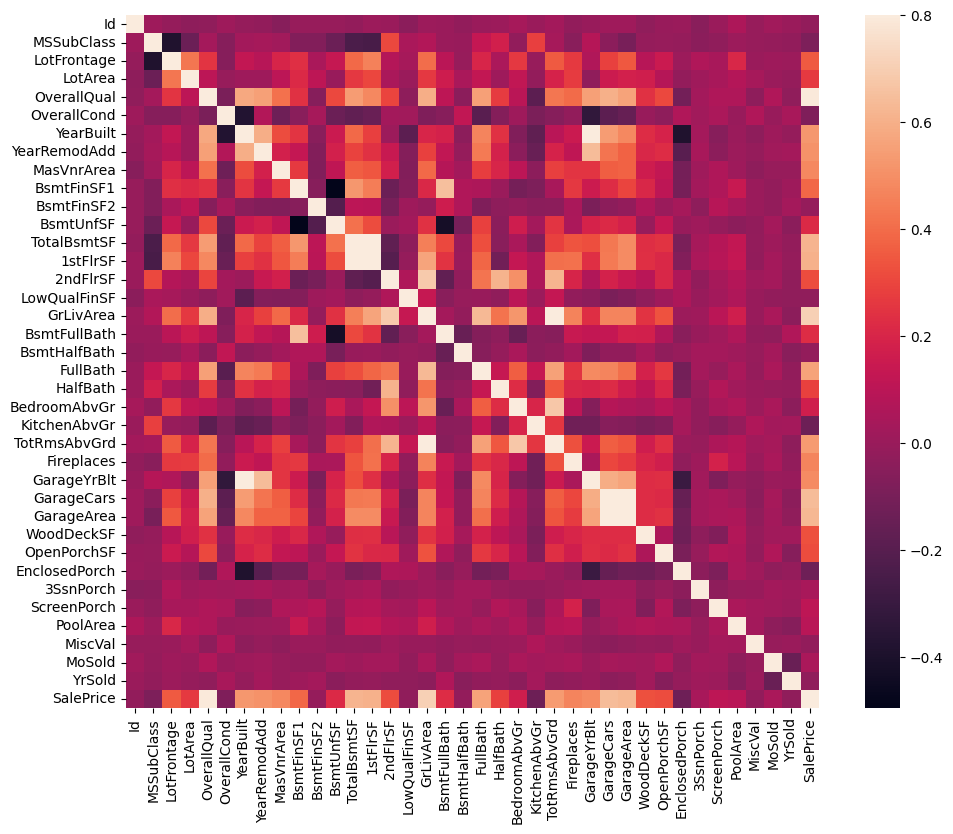

In [182]:
# Calculate correlation matrix for numeric columns
corrmatrix = quant_df.corr()  # Calculate correlation matrix for numeric columns
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmatrix, vmax=.8, square=True);

In [183]:
# Find most important features relative to target
print("Find most important features relative to target")
corr = ames_homes_train_df.corr()
corr.sort_values(["SalePrice"], ascending = False, inplace = True)
print(corr.SalePrice)

Find most important features relative to target
SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   

<ipython-input-183-1760fb9a4308>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = ames_homes_train_df.corr()


In [184]:
quant_to_drop = ['Id', 'LotFrontage', 'MSSubClass',  'KitchenAbvGr', 'EnclosedPorch',
       'OverallCond',   'BsmtFinSF1', 'BsmtFinSF2',  'LowQualFinSF',  'GarageArea', 'MiscVal', 'YrSold', 'BsmtHalfBath', 'SalePrice']

In [185]:
quant_df.drop(quant_to_drop, axis=1, inplace=True)

<ipython-input-185-e4bd9ca9b3f8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  quant_df.drop(quant_to_drop, axis=1, inplace=True)


In [186]:
quant_df.head()

,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,...,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,PoolArea,MoSold
0,8450,7,2003,2003,196.0,150,856,856,854,1710,...,8,0,2003.0,2,0,61,0,0,0,2
1,9600,6,1976,1976,0.0,284,1262,1262,0,1262,...,6,1,1976.0,2,298,0,0,0,0,5
2,11250,7,2001,2002,162.0,434,920,920,866,1786,...,6,1,2001.0,2,0,42,0,0,0,9
3,9550,7,1915,1970,0.0,540,756,961,756,1717,...,7,1,1998.0,3,0,35,0,0,0,2
4,14260,8,2000,2000,350.0,490,1145,1145,1053,2198,...,9,1,2000.0,3,192,84,0,0,0,12


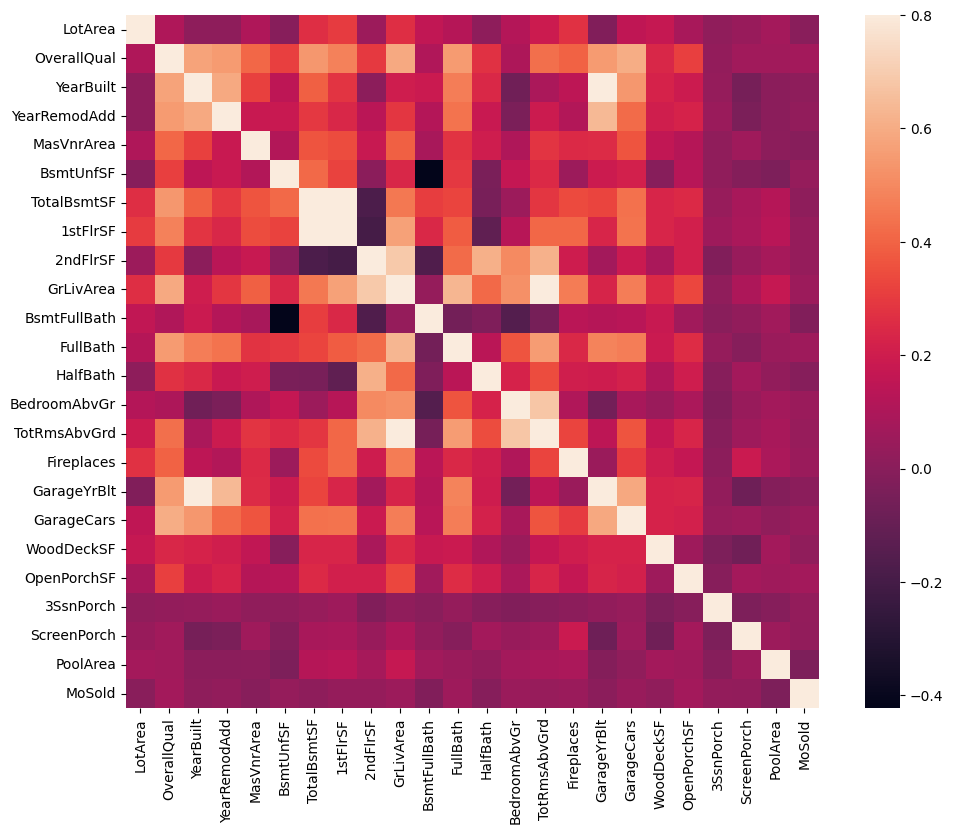

In [187]:
# Calculate correlation matrix for numeric columns after dropping
corrmatrix = quant_df.corr()  # Calculate correlation matrix for numeric columns
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmatrix, vmax=.8, square=True);

In [188]:
qual_df.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [189]:
qual_to_drop = [ 'Alley', 'LotShape', 'Utilities','LotConfig',  'Condition1', 'Condition2',
       'Exterior1st', 'Exterior2nd',  'ExterQual', 'ExterCond',
       'BsmtQual', 'BsmtCond', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',  'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageFinish', 'GarageQual','GarageCond',  'PoolQC',  'MiscFeature']

In [190]:
qual_df.drop(qual_to_drop, axis=1, inplace=True)

<ipython-input-190-4fda2fefd7f4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qual_df.drop(qual_to_drop, axis=1, inplace=True)


In [191]:
# fill the null fields

# "NA" means No Fence according to doc
qual_df['Fence'] = qual_df['Fence'].fillna('NA')
qual_df['CentralAir'] = qual_df['CentralAir'].fillna('N')

# for all others, "unknown"
qual_df = qual_df.fillna('unknown')

<ipython-input-191-ae60aed25aec>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qual_df['Fence'] = qual_df['Fence'].fillna('NA')
<ipython-input-191-ae60aed25aec>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qual_df['CentralAir'] = qual_df['CentralAir'].fillna('N')


In [192]:
# fill null numeric data with the average for the colomn
quant_df = quant_df.fillna(quant_df.mean())

In [193]:
# Encode the qualitative data

qual_cols = qual_df.columns
print(qual_cols)

Index(['MSZoning', 'Street', 'LandContour', 'LandSlope', 'Neighborhood',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'MasVnrType',
       'Foundation', 'BsmtExposure', 'Heating', 'CentralAir', 'Electrical',
       'GarageType', 'PavedDrive', 'Fence', 'SaleType', 'SaleCondition'],
      dtype='object')


In [194]:

# Create dummy variables
df_dummies = pd.get_dummies(qual_df, columns=qual_cols)

df_dummies.columns

Index(['MSZoning_C (all)', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL',
       'MSZoning_RM', 'Street_Grvl', 'Street_Pave', 'LandContour_Bnk',
       'LandContour_HLS', 'LandContour_Low',
       ...
       'SaleType_ConLw', 'SaleType_New', 'SaleType_Oth', 'SaleType_WD',
       'SaleCondition_Abnorml', 'SaleCondition_AdjLand',
       'SaleCondition_Alloca', 'SaleCondition_Family', 'SaleCondition_Normal',
       'SaleCondition_Partial'],
      dtype='object', length=126)

In [195]:
# concatinate nummeric and quantitative features
combined_df = pd.concat([df_dummies, quant_df], axis=1)
combined_df.head()

,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LandContour_Bnk,LandContour_HLS,LandContour_Low,...,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,PoolArea,MoSold
0,0,0,0,1,0,0,1,0,0,0,...,8,0,2003.0,2,0,61,0,0,0,2
1,0,0,0,1,0,0,1,0,0,0,...,6,1,1976.0,2,298,0,0,0,0,5
2,0,0,0,1,0,0,1,0,0,0,...,6,1,2001.0,2,0,42,0,0,0,9
3,0,0,0,1,0,0,1,0,0,0,...,7,1,1998.0,3,0,35,0,0,0,2
4,0,0,0,1,0,0,1,0,0,0,...,9,1,2000.0,3,192,84,0,0,0,12


In [196]:
len(combined_df)

1460

Create and Train the Model

In [197]:
y = ames_homes_train_df['SalePrice'].values
X = combined_df.values

# Split the preprocessed data into a training and testing dataset
# This is reserving part of the training data for testing, which
# is apparently recommended by Kaggle.
# For the comoetition, the same transformations that were done
# to the training data would have to be made on the test data
# and then the predictions made on the test data set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [198]:
# Create a StandardScaler instance
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)


In [202]:
# create the linear_regression_model
lreg_model = LinearRegression()
lreg_model.fit(X_train, y_train)

# Make predictions
lreg_model_y_pred = lreg_model.predict(X_test)

# Where y_true and y_pred are the actual values and predicted values
mse = mean_squared_error(y_test, lreg_model_y_pred)

print(f"Linear Regression Mean Squared Error: {mse}")

Linear Regression Mean Squared Error: 1573856844.086771


In [214]:
# Create array to save all models to compare them

models = []
models_mse = []
models_rsq = []

models.append("Linear Regression")
models_mse.append(mse)


In [215]:
# Make a prediction using the testing data

# Generate training predictions for later use
training_predictions = lreg_model.predict(X_train)

# Generate testing predictions
testing_predictions = lreg_model.predict(X_test)

testing_predictions

array([306174.29901193, 143384.31639592,  97214.19557976, 223024.30165079,
       101821.72065293, 125093.95321816, 267160.96843992, 129594.86288494,
       503081.72300961, 148365.24621694, 200082.39959494, 130490.89630108,
       228776.81627588, 114253.0301308 , 129752.45104839, 134805.16287073,
       262570.84518414, 126866.07837289, 128872.00611442, 167077.34901895,
       125398.06770259, 180077.03497077,  95460.9623798 , 158825.85847999,
       186066.67988615, 179086.391699  , 148252.13035552,  69858.24914785,
       278494.8164662 , 106223.06643541, 129259.58003394, 200676.05561757,
       150512.26615193, 313869.85042194, 346839.56673633, 212592.23569604,
       266074.62337185, 131127.80101892, 238701.55722954, 340046.26996395,
       185930.2869006 , 105404.38912454, 212335.67772274, 300296.56029849,
       340781.98152216, 118486.25244904, 135662.1647075 , 140439.58849801,
       182911.42205997,  82776.69773597, 381612.78203976, 141975.73543125,
       177444.92663547,  

In [280]:
# check r squared

y_pred = lreg_model.predict(X)

# Calculate the R-squared score
r_squared = r2_score(y, y_pred)

print(f"R-squared: {r_squared:.4f}")

R-squared: 0.8530


In [220]:
# Save results for later comparison

models_mse.append(r_squared)

## Evaluate Using Ridge Regression

In [273]:
# ridge regression on already-processed data

# This needs a script for tuning
#alphas = [0.001, 0.01, 0.1, 1, 10, 30, 100]
alphas = [0.005, 0.05, 0.5, 1, 10, 30, 100]

ridge_cv_rgr = RidgeCV(alphas=alphas, cv=10)

# Fit the model to the training data
ridge_cv_rgr.fit(X_train, y_train)

# Make predictions on the test data
y_pred = ridge_cv_rgr.predict(X_test)

# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
models.append("Ridge Regression")
models_mse.append(mse)

print(f"Ridge Regression MSE: {mse}")

models.append("Ridge Regression Cols Removed")
models_mse.append(mse)

Ridge Regression MSE: 1503095178.1047802


In [281]:
# check r squared

y_pred = ridge_cv_rgr.predict(X)

# Calculate the R-squared score
r_squared = r2_score(y, y_pred)

print(f"R-squared: {r_squared:.4f}")

R-squared: 0.8506


In [237]:
best_alpha = ridge_cv_rgr.alpha_
print("Best alpha:", best_alpha)

Best alpha: 10.0


In [234]:
# Save results for later comparison
# Ridge regression performed slighly worse than linear regression on the data with the columns removed

models_mse.append(r_squared)

## Evaluate Using Lasso Regression

In [266]:
# Examine A Lasso Regression
# started with alpha at default1, checked 10, 30, 20, a tuned array would but no doubt be better
alpha = 20.0

lasso_regressor = Lasso(alpha=alpha)

# Fit the model to the training data
lasso_regressor.fit(X_train, y_train)

# Make predictions on the test data
lasso_y_pred = lasso_regressor.predict(X_test)
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, lasso_y_pred)

models.append("Lasso Regression")
models_mse.append(mse)

print(f"Lasso Regression MSE: {mse}")

Lasso Regression MSE: 1467394770.525181


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.036e+11, tolerance: 6.234e+08
  model = cd_fast.enet_coordinate_descent(


In [278]:
# check r squared

y_pred = lasso_regressor.predict(X)

# Calculate the R-squared score
r_squared = r2_score(y, y_pred)

print(f"R-squared: {r_squared:.4f}")

R-squared: 0.8573


## Evaluate Using Random Forest

In [257]:
# Examine whether a Random Forest model would perform better
# after about five rounds of manually tuning, it is evident
# that an automated tuning script is needed for optimatl results

# Create a random forest classifier.
rf_model = RandomForestClassifier( n_estimators=128, min_samples_split=6,
                                  max_depth=10, min_samples_leaf=2, random_state=78)

# itting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = rf_model.predict(X_test_scaled)
print(f"Random forest model accuracy: {accuracy_score(y_test, y_pred):.4f}")

Random forest model accuracy: 0.0205


## Compile, Train and Evaluate a Deep Learning Model
Use Keras Tuner to create list of best hyperparemeters

In [286]:
# Create a function for Keras Tuner to use in evaluating best model hyperparameters
def create_model(hp):
    nnk_model = tf.keras.models.Sequential()

    # Allow kerastuner to decide which activation function to use in hidden layers
    activation = hp.Choice('activation',['relu', 'tanh', 'sigmoid'])

    # Allow kerastuner to decide number of neurons in first layer
    nnk_model.add(tf.keras.layers.Dense(units=hp.Int('first_units',
        min_value=1,
        max_value=80,
        step=5), activation=activation, input_dim=150))

    # Allow kerastuner to decide number of hidden layers and neurons in hidden layers
    for i in range(hp.Int('num_layers', 1, 5)):
        nnk_model.add(tf.keras.layers.Dense(units=hp.Int('units_' + str(i),
            min_value=1,
            max_value=30,
            step=5),
            activation=activation))

    nnk_model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

    # Compile the model
    nnk_model.compile(loss="binary_crossentropy", optimizer='adam', metrics=["accuracy"])

    return nnk_model

In [287]:
# create the tuner using the create_model function

tuner = kt.Hyperband(
    create_model,
    objective="val_accuracy",
    max_epochs=20,
    hyperband_iterations=2)

In [288]:
# Run the kerastuner search for best hyperparameters

tuner.search(X_train_scaled,y_train,epochs=20,validation_data=(X_test_scaled,y_test))

Trial 60 Complete [00h 00m 07s]
val_accuracy: 0.0

Best val_accuracy So Far: 0.0
Total elapsed time: 00h 04m 22s


In [289]:
# Get top 3 model hyperparameters and print them

top_hyper = tuner.get_best_hyperparameters(3)
for param in top_hyper:
    print(param.values)

{'activation': 'sigmoid', 'first_units': 21, 'num_layers': 2, 'units_0': 6, 'tuner/epochs': 3, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0, 'units_1': 1}
{'activation': 'tanh', 'first_units': 11, 'num_layers': 4, 'units_0': 21, 'units_1': 1, 'tuner/epochs': 3, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0, 'units_2': 1, 'units_3': 1}
{'activation': 'tanh', 'first_units': 56, 'num_layers': 4, 'units_0': 16, 'units_1': 16, 'units_2': 11, 'units_3': 21, 'tuner/epochs': 3, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}


In [290]:
# Evaluate the top 3 models against the test data

top_model = tuner.get_best_models(3)
for model in top_model:
    model_loss, model_accuracy = model.evaluate(X_test_scaled,y_test,verbose=2)
    print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

14/14 - 0s - loss: -1.6679e+05 - accuracy: 0.0000e+00 - 275ms/epoch - 20ms/step
Loss: -166789.65625, Accuracy: 0.0
14/14 - 0s - loss: -2.0248e+04 - accuracy: 0.0000e+00 - 319ms/epoch - 23ms/step
Loss: -20248.078125, Accuracy: 0.0
14/14 - 0s - loss: -1.9742e+05 - accuracy: 0.0000e+00 - 321ms/epoch - 23ms/step
Loss: -197421.484375, Accuracy: 0.0
